In [65]:
# Modules + Libraries necessary to import
!pip install networkx

import numpy as np
import shapely.geometry as geom
%matplotlib inline
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd
import warnings
warnings.filterwarnings("ignore")
import csv
# Standard packages
import json
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
!pip install git+https://github.com/python-visualization/branca.git@main
import folium
from folium import Choropleth, Circle, Marker, CircleMarker, GeoJson, FeatureGroup, LayerControl
from folium.plugins import HeatMap, MarkerCluster
from folium.vector_layers import PolyLine, Polygon
from folium.map import Icon

# Geo data manipulation
from shapely.geometry import LineString, Polygon

# To display stuff in notebook
from IPython.display import display, Markdown

!pip install pyarrow geopandas shapely fiona
!pip install rtree


[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: pip install --upgrade pip
  Cloning https://github.com/python-visualization/branca.git (to revision main) to /tmp/pip-req-build-i4yvk1tm
  Running command git clone --filter=blob:none --quiet https://github.com/python-visualization/branca.git /tmp/pip-req-build-i4yvk1tm
  Resolved https://github.com/python-visualization/branca.git to commit 1130437265e088ebb6f660f349b30ca0f21c18a9
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done

[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: pip install --upgrade pip


In [74]:
# Reading GTFS files
agency = pd.read_csv('sao_paulo_data/agency.txt')
stops = pd.read_csv('sao_paulo_data/stops.txt')
routes = pd.read_csv('sao_paulo_data/routes.txt', delimiter = "\t",header=None)
trips = pd.read_csv('sao_paulo_data/trips.txt')
stop_times = pd.read_csv('sao_paulo_data/stop_times.txt')
calendar = pd.read_csv('sao_paulo_data/calendar.txt')
fare_attributes = pd.read_csv('sao_paulo_data/fare_attributes.txt')
fare_rules = pd.read_csv('sao_paulo_data/fare_rules.txt')
shapes = pd.read_csv('sao_paulo_data/shapes.txt', quoting=csv.QUOTE_NONE, encoding='utf-8')
frequencies = pd.read_csv('sao_paulo_data/frequencies.txt')

with open('sao_paulo_geojson/saopaulo.json', 'r') as json_file:
    city_boundary_data = json.load(json_file)


In [75]:
# Read initital routes data once more w/out delimeter
routes = pd.read_csv('sao_paulo_data/routes.txt')
routesWithLong = pd.read_csv('sao_paulo_data/routes.txt')


routes = routes.drop(columns=['route_long_name'])
routes

# Routes
# Dropping columns
routes = routes.drop(columns=['agency_id', 'route_text_color'])

# Adding information
routes['route_type'] = routes['route_type'].replace({
    1:'Metro',
    2:'Rail',
    3:'Bus'
})

routes['route_type'] = routes['route_type'].replace({
    1:'Metro',
    2:'Rail',
    3:'Bus'
})

color_region_dict = {
    '509E2F':'Northwest',
    '002F6C':'North',
    'FFD100':'Northeast',
    'DA291C':'East',
    '006341':'Southeast',
    '0082BA':'South',
    'FF671F':'West',
    '782F40':'Southwest'
}
routes['region'] = routes['route_color'].replace(color_region_dict)

# Stop times
# Changing columns
stop_times = stop_times.drop(columns=['departure_time'])
stop_times = stop_times.rename(columns={'arrival_time':'time'})

# Converting column time to deltas of time minus start_time
stop_times['time'] = pd.to_datetime(stop_times['time'])
start_times = stop_times[stop_times['stop_sequence'] == 1].set_index('trip_id')['time'].rename('start_time')
stop_times = stop_times.join(start_times, on='trip_id', how='left')
stop_times['time'] = stop_times['time'] - stop_times['start_time']
stop_times = stop_times.drop(columns=['start_time'])

# Calendar
# Creating description
calendar['description'] = calendar['service_id'].replace({
    'USD':'All days',
    'U__':'Business days',
    'US_':'Business days / Saturday',
    '_SD':'Weekends',
    '__D':'Sundays',
    '_S_':'Saturdays'
})

calendar = calendar.loc[:, ['service_id', 'description']]

# Fare attributes
# Dropping columns
fare_attributes = fare_attributes.drop(columns=['transfers'])

# Adding information
fare_attributes['payment_method'] = 'On board'

# Fare rules
# Dropping columns with all values missing.
fare_rules = fare_rules.drop(columns=['origin_id', 'destination_id', 'contains_id'])

# Frequencies
# Creating unified time column
frequencies['time_bin'] = frequencies['start_time'].apply(lambda x: x[:5])
frequencies = frequencies.drop(columns = [
    'start_time',
    'end_time'
])

# Adding number of departures by hour
frequencies['n_departures'] = (3600 / frequencies['headway_secs']).astype(int)
frequencies = frequencies.drop(columns = ['headway_secs'])

# Joins
routes_plus = fare_rules.merge(fare_attributes, right_on='fare_id', left_on='fare_id', how='left')
routes_plus = routes.merge(routes_plus, right_on='route_id', left_on='route_id', how='left')
route_trips = routes.merge(trips, how='left', left_on='route_id', right_on='route_id')
trips_service = route_trips.merge(calendar, how='left', left_on='service_id', right_on='service_id')
trips_freq = route_trips.merge(frequencies, how='left', left_on='trip_id', right_on='trip_id')
trips_stops = route_trips.merge(stop_times, how='left', left_on='trip_id', right_on='trip_id')
trips_stops = trips_stops.merge(stops, how='left', left_on='stop_id', right_on='stop_id')

# Below code is for shapes data, error with how the data is constructed.

shapes.columns = shapes.columns.str.replace('"', '')  # Remove double quotes from column names
#trips_shape = route_trips.merge(shapes, how='left', left_on='shape_id', right_on='shape_id')
# Convert 'shape_id' column in route_trips DataFrame to object type
route_trips['shape_id'] = route_trips['shape_id'].astype(str)

# Convert 'shape_id' column in shapes DataFrame to object type
shapes['shape_id'] = shapes['shape_id'].astype(str)

# Now, perform the merge operation
trips_shape = route_trips.merge(shapes, how='left', on='shape_id')


In [76]:
# You can see from this that there are a total of 1347 Bus Routes but only 6 Metro Routes! A few more metro routes couldn't hurt
routes['route_type'].value_counts()


route_type
Bus      1347
Rail        7
Metro       6
Name: count, dtype: int64

In [77]:
not_bus_routes = routes[routes['route_type'].isin(['Rail', 'Metro'])].reset_index(drop=True)
not_bus_routes

,route_id,route_short_name,route_type,route_color,region
0,CPTM L07,CPTM L07,Rail,CA016B,CA016B
1,CPTM L08,CPTM L08,Rail,97A098,97A098
2,CPTM L09,CPTM L09,Rail,01A9A7,01A9A7
3,CPTM L10,CPTM L10,Rail,049FC3,049FC3
4,CPTM L11,CPTM L11,Rail,F68368,F68368
5,CPTM L12,CPTM L12,Rail,133C8D,133C8D
6,CPTM L13,CPTM L13,Rail,00B352,00B352
7,METRÔ 15,METRÔ 15,Metro,C0C0C0,C0C0C0
8,METRÔ L1,METRÔ L1,Metro,0455A1,0455A1
9,METRÔ L2,METRÔ L2,Metro,007E5E,007E5E


In [78]:
# Convert shape_id in trips_shape to string
# Filter trips_shape to include only metro routes and select the shape_id column
trips_shape_geo = trips_shape.loc[trips_shape['route_type'] == 'Metro', 'shape_id']

# Convert shape_id to string and remove trailing ".0" if present
trip_shapes_trans = trips_shape_geo.astype(str).str.replace('\.0', '', regex=True)


# Convert shape_id in shapes to string
shapes_id = shapes['shape_id']
shapes_id_clean = shapes_id.str.strip('"')


#trip_shapes_trans
#shapes_id_clean
shapes


,shape_id,shape_pt_lat,shape_pt_lon,shape_pt_sequence,shape_dist_traveled
0,"""72757""","""-23.432174""","""-46.787095""","""1""","""0"""
1,"""72757""","""-23.432116""","""-46.787105""","""2""","""6.5046821"""
2,"""72757""","""-23.431590""","""-46.787191""","""3""","""65.418427"""
3,"""72757""","""-23.431476""","""-46.787206""","""4""","""78.136925"""
4,"""72757""","""-23.431438""","""-46.787210""","""5""","""82.364815"""
...,...,...,...,...,...
1128778,"""62557""","""-23.654782""","""-46.761548""","""1064""","""24178.354"""
1128779,"""62557""","""-23.654284""","""-46.762232""","""1065""","""24267.301"""
1128780,"""62557""","""-23.654177""","""-46.762379""","""1066""","""24286.414"""
1128781,"""62557""","""-23.654077""","""-46.762517""","""1067""","""24304.326"""


In [79]:
import re

# Convert shape_id in trips_shape to string
trips_shape_geo = trips_shape['shape_id']
trip_shapes_trans = trips_shape_geo.astype(str).str.replace('\.0', '', regex=True)

shape_ids = trip_shapes_trans[trips_shape['route_type'] == 'Metro']
trip_shapes_df = shape_ids.to_frame(name='shape_id')


# Convert shape_id in shapes to string
shapes_id = shapes['shape_id']
shapes_id_clean = shapes_id.str.strip('"')
shapes_id_df = shapes_id_clean.to_frame(name='shape_id')
# Filter shapes_id_df to include only metro shape IDs
common_shapes_id_df = shapes_id_df[shapes_id_df['shape_id'].isin(trip_shapes_df['shape_id'])]
common_shapes_unique = common_shapes_id_df['shape_id'].unique()
common_shapes_unique_df = pd.DataFrame(common_shapes_unique, columns=['shape_id'])

# Add quotes around shape IDs
common_shapes_unique_df['shape_id'] = common_shapes_unique_df['shape_id'].apply(lambda x: f'"{x}"')

# Initialize an empty list to store the coordinates
coordinates = []

# Iterate over each shape ID in common_shapes_unique_df
for shape_id in common_shapes_unique_df['shape_id']:
    # Filter the shapes DataFrame for the current shape ID
    shape_data = shapes[shapes['shape_id'].astype(str).isin([shape_id])]
    
    # Iterate over each row in the filtered shape data
    for _, row in shape_data.iterrows():
        # Extract latitude and longitude values and convert them to floats
        lat = float(row['shape_pt_lat'].strip('"'))
        lon = float(row['shape_pt_lon'].strip('"'))
        
        # Append the coordinates to the list
        coordinates.append((lat, lon))

# Create a map centered at São Paulo
map_sp = folium.Map(location=[-23.5505, -46.6333], zoom_start=11)

folium.GeoJson(
    city_boundary_data,
    style_function=lambda feature: {
        'color': 'green',     # Change the color to green
        'weight': 1           # Reduce the thickness of the boundary
    }
).add_to(map_sp)

# Add polyline to the map using the coordinates list
folium.PolyLine(locations=coordinates, color='blue').add_to(map_sp)

map_sp


In [80]:
df_district_geo = gpd.read_parquet(
    'sao_paulo_prefectures/tb_district.parquet'
)

# Select only the "Prefecture Name" and "Geometry" columns
df_district_geo = df_district_geo[['district', 'geometry']]

# Reset indexes to start from 0 and drop the old indexes
df_district_geo.reset_index(drop=True, inplace=True)

# Create a new column with IDs
df_district_geo['ID'] = df_district_geo.index

df_district_geo

,district,geometry,ID
0,MARSILAC,"POLYGON ((-46.60991 -23.90556, -46.60994 -23.9...",0
1,PARELHEIROS,"POLYGON ((-46.76971 -23.75680, -46.76712 -23.7...",1
2,VILA ANDRADE,"POLYGON ((-46.70140 -23.62004, -46.70174 -23.6...",2
3,ANHANGUERA,"POLYGON ((-46.78603 -23.40507, -46.78599 -23.4...",3
4,PEDREIRA,"POLYGON ((-46.68566 -23.70003, -46.68539 -23.6...",4
...,...,...,...
91,PERDIZES,"POLYGON ((-46.69302 -23.54508, -46.69308 -23.5...",91
92,AGUA RASA,"POLYGON ((-46.58152 -23.57304, -46.58154 -23.5...",92
93,CONSOLACAO,"POLYGON ((-46.65905 -23.55942, -46.65912 -23.5...",93
94,SAUDE,"POLYGON ((-46.65086 -23.59874, -46.65065 -23.5...",94


In [81]:
df_district = gpd.read_parquet(
    'sao_paulo_prefectures/tb_district.parquet'
)

df_district


,district,district_alphabetized_population,district_area_in_hectares,district_average_age_household_leaders,district_average_age_women_household_leaders,district_average_household_income,district_average_income_household_leaders,district_average_income_women_household_leaders,district_average_ipvs_factor_1,district_average_ipvs_factor_1_rural,...,district_n_favelas,district_total_favela_area,district_n_train_stations,score_district_literacy_rate,score_district_average_monthly_income,score_district_average_per_capita_income,score_district_population,score_district_average_lot_square_meter_value,score_district_average_construction_square_meter_value,score_district_average_property_age
0,MARSILAC,6794.0,20261.957953,39.319944,38.513131,987.431187,563.523342,391.291533,-0.479553,NaN,...,1,3118.0,0,1.000000,0.000000,0.000000,0.000000,0.368421,0.094737,0.000000
1,PARELHEIROS,110265.0,12306.214749,40.660263,40.516660,1387.092430,700.597502,497.551290,-0.537707,NaN,...,35,480404.0,0,0.989474,0.031579,0.010526,0.705263,0.021053,0.000000,0.010526
2,VILA ANDRADE,108884.0,1027.327488,44.741235,45.840362,9424.149816,6458.129285,3798.478716,1.386117,NaN,...,13,873586.0,0,0.905263,0.957895,0.894737,0.642105,0.631579,0.421053,0.021053
3,ANHANGUERA,56409.0,3188.851131,39.241917,40.270466,1632.642767,912.928681,626.961651,-0.269725,NaN,...,12,94116.0,0,0.915789,0.178947,0.115789,0.221053,0.000000,0.010526,0.031579
4,PEDREIRA,122814.0,1686.650041,43.141531,44.724603,1741.680290,903.343457,617.415326,-0.416056,NaN,...,32,694767.0,0,0.842105,0.126316,0.147368,0.736842,0.126316,0.157895,0.042105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,PERDIZES,105088.0,633.076309,49.971528,51.741764,8404.768534,5348.825368,3963.448067,2.084867,NaN,...,0,0.0,0,0.063158,0.884211,0.915789,0.557895,0.894737,0.894737,0.957895
92,AGUA RASA,79179.0,715.156014,52.165328,54.464462,3845.878502,2182.197367,1417.359154,0.487378,NaN,...,1,776.0,0,0.200000,0.631579,0.652632,0.347368,0.652632,0.684211,0.968421
93,CONSOLACAO,55044.0,375.265941,48.304853,50.108060,8215.395083,5740.945679,4276.265379,2.620133,NaN,...,0,0.0,2,0.000000,0.905263,0.947368,0.168421,0.978947,0.989474,0.978947
94,SAUDE,123146.0,925.883655,50.247848,51.925059,6600.433044,4090.856885,3004.265887,1.465805,NaN,...,4,14554.0,3,0.094737,0.852632,0.852632,0.694737,0.810526,0.852632,0.989474


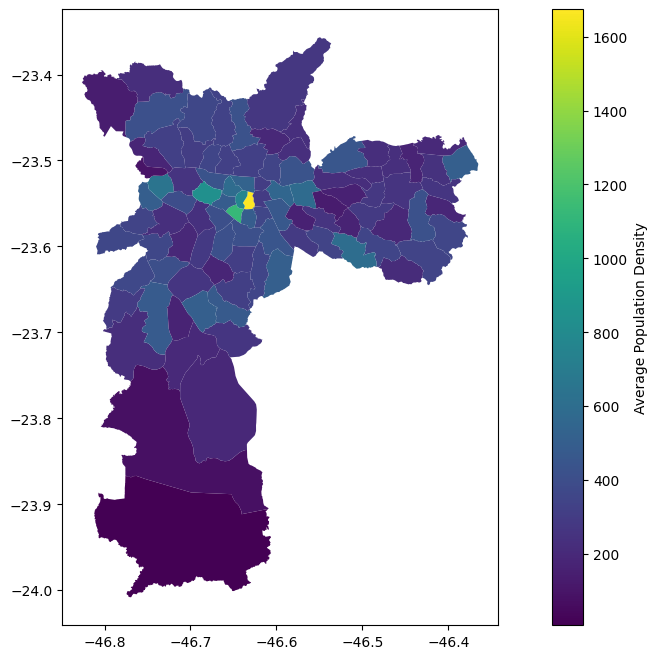

In [82]:
# doing some geospatial visualizations:
df_district.plot(
    column = 'district_average_population_density',
    legend = True,
    legend_kwds={
        'label': "Average Population Density",
        'orientation': "vertical"
    },
    figsize = (14, 8)
); 

# In this figure you can clearly see how the population density is highest in the middle/center and decreases as you go outwards

In [85]:
df_merged = df_district_geo.merge(df_district[['district', 'geometry', 'district_average_population_density']], on='district')
df_merged.drop(columns=['ID'], inplace=True)


# Set a threshold for high population density
population_density_threshold = 350  # Adjust as needed

high_density_no_metro = df_merged[df_merged['district_average_population_density'] > population_density_threshold]

# Filter out rows with missing or invalid geometries
high_density_no_metro = high_density_no_metro[high_density_no_metro['geometry_x'].notnull() & high_density_no_metro['geometry_y'].notnull()]

# Visualize the high-density areas without metro lines on a map
map_proposed_metro_lines = folium.Map(location=[-23.5505, -46.6333], zoom_start=11)

# Add GeoJSON layer for high-density areas without metro lines
folium.GeoJson(
    city_boundary_data,
    name='High Density Areas',
    tooltip=folium.features.GeoJsonTooltip(fields=['ID'], labels=True, sticky=False)
).add_to(map_proposed_metro_lines)

# Add markers for high-density areas without metro lines to the map
for _, row in high_density_no_metro.iterrows():
    centroid = (row.geometry_x.centroid.y, row.geometry_x.centroid.x)
    map_proposed_metro_lines.add_child(folium.PolyLine(locations=[centroid, [-23.5505, -46.6333]], color='blue'))


# Save the map
map_proposed_metro_lines


  route_type   time                                     
              count  mean   std   25%   50%   75%    max
0        Bus  94875  2418  1844   966  2040  3496  12300
1      Metro    184  1224   830   555  1130  1825   3230
2       Rail    206  2946  2251  1080  2520  4320   8820


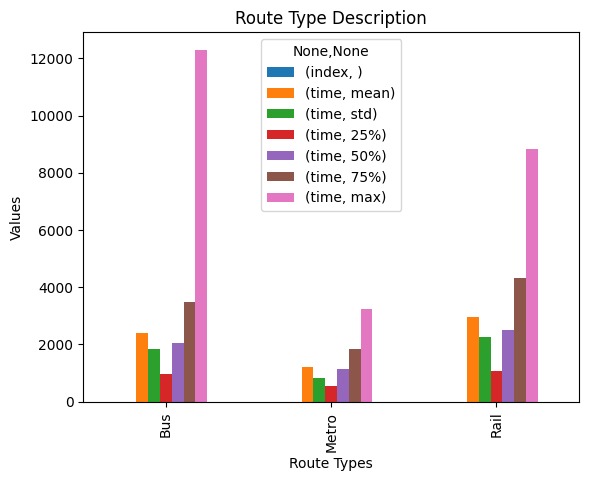

In [86]:
# Making a distribution of time related things grouping by bus, metro, and rail 


groupByType = trips_stops[["route_type", "time"]].groupby(["route_type"]).describe()
groupByType.drop(('time', 'min'), axis=1, inplace=True)


groupByType
cluster_variables = [("time", "count"),
                     ("time", "mean"), 
                     ("time", "std"),
                    #  ("time", "min"),
                     ("time", "25%"),
                     ("time", "50%"), 
                     ("time", "75%"), 
                     ("time", "max")]

# Changing everything to seconds
groupByType[('time', 'mean')] = pd.to_timedelta(groupByType[('time', 'mean')]).dt.total_seconds().astype(int)
groupByType[('time', 'std')] = pd.to_timedelta(groupByType[('time', 'std')]).dt.total_seconds().astype(int)
# groupByType[('time', 'min')] = pd.to_timedelta(groupByType[('time', 'min')]).dt.total_seconds().astype(int)
groupByType[('time', '25%')] = pd.to_timedelta(groupByType[('time', '25%')]).dt.total_seconds().astype(int)
groupByType[('time', '50%')] = pd.to_timedelta(groupByType[('time', '50%')]).dt.total_seconds().astype(int)
groupByType[('time', '75%')] = pd.to_timedelta(groupByType[('time', '75%')]).dt.total_seconds().astype(int)
groupByType[('time', 'max')] = pd.to_timedelta(groupByType[('time', 'max')]).dt.total_seconds().astype(int)

# Convert 'time count' to integer
groupByType[('time', 'count')] = groupByType[('time', 'count')].astype(int)
groupByType.reset_index(inplace=True)
print(groupByType)



# # Index db on cluster ID
# tidy_db = groupByType.set_index('route_type')
# # Keep only variables used for clustering
# tidy_db = tidy_db[cluster_variables]
# # Stack column names into a column, obtaining
# # a "long" version of the dataset
# tidy_db = tidy_db.stack()
# # Take indices into proper columns
# tidy_db = tidy_db.reset_index()
# # Rename column names
# tidy_db = tidy_db.rename(columns={
#                         'level_1': 'Attribute',
#                         0: 'Values'})


# Plotting the bar chart and dropping count for the Bar Chart

groupByTypeWithoutCount = groupByType.drop(('time', 'count'), axis=1)
groupByTypeWithoutCount.reset_index(inplace=True)
df = pd.DataFrame(groupByTypeWithoutCount)
df.plot(kind='bar', x='route_type')

# Adding labels and title
plt.xlabel('Route Types')
plt.ylabel('Values')
plt.title('Route Type Description')
# Displaying the plot
plt.show()



In [87]:
route_trips
max_time = df_district['district_average_population_density'].max()
filtered_district = df_district[df_district['district_average_population_density'] == max_time]
max_average_pop_district = (filtered_district[['district', 'district_average_population_density']])


filtered_district = df_district[df_district["district"] == 'SE']
filtered_district

,district,district_alphabetized_population,district_area_in_hectares,district_average_age_household_leaders,district_average_age_women_household_leaders,district_average_household_income,district_average_income_household_leaders,district_average_income_women_household_leaders,district_average_ipvs_factor_1,district_average_ipvs_factor_1_rural,...,district_n_favelas,district_total_favela_area,district_n_train_stations,score_district_literacy_rate,score_district_average_monthly_income,score_district_average_per_capita_income,score_district_population,score_district_average_lot_square_meter_value,score_district_average_construction_square_meter_value,score_district_average_property_age
48,SE,21510.0,210.951526,40.775158,44.477888,2288.774737,1432.640879,1195.191793,0.659288,NaN,...,0,0.0,4,0.442105,0.421053,0.442105,0.031579,0.968421,0.915789,0.505263


In [88]:
# This calculates clustering coefficient on the cities that each metro lines stops at
desiredMetro = connectMetro = routes[routes['route_type'] == 'Metro']['route_id'].values



trips_stops_metro = trips_stops[trips_stops['route_id'].isin(desiredMetro)]
route_list = trips_stops_metro['route_id'].values
stop_list = trips_stops_metro["stop_name"].values

len(trips_stops_metro)
gd_stops_metro = nx.DiGraph()
for i in range(len(trips_stops_metro)):
    gd_stops_metro.add_edge(route_list[i], stop_list[i])
G1 = gd_stops_metro
list_of_metro = [x for x in gd_stops_metro.nodes() if "METRÔ" in x]

list_of_metro
METRÔ_15 = G1.subgraph(G1['METRÔ 15'])
METRÔ_L1 = G1.subgraph(G1['METRÔ L1'])
METRÔ_L2 = G1.subgraph(G1['METRÔ L2'])
METRÔ_L3 = G1.subgraph(G1['METRÔ L3'])
METRÔ_L4 = G1.subgraph(G1['METRÔ L4'])
METRÔ_L5 = G1.subgraph(G1['METRÔ L5'])
METRÔ_15.nodes()
new_list_of_metro = [METRÔ_15, METRÔ_L1, METRÔ_L2, METRÔ_L3, METRÔ_L4, METRÔ_L5]

CityToCity = routesWithLong['route_long_name'].values # connecting each bus route to each end location of metro stop. Which Metro stops has the most bus routes?
CityToCity = [x.split(" - ") for x in CityToCity]
new_list = []
for y in new_list_of_metro:
    copy = y.copy() 
    print(copy.nodes())
    for x in range(len(CityToCity)):
        if CityToCity[x][0] in copy.nodes():        
            copy.add_edge(CityToCity[x][0], CityToCity[x][1])
        elif CityToCity[x][1] in copy.nodes():
            copy.add_edge(CityToCity[x][1], CityToCity[x][0])
    new_list.append(copy)

new_list_containing_6_graphs = new_list
METRÔ_15 = new_list_containing_6_graphs[0]
METRÔ_L1 = new_list_containing_6_graphs[1]
METRÔ_L2 = new_list_containing_6_graphs[2]
METRÔ_L3 = new_list_containing_6_graphs[3]
METRÔ_L4 = new_list_containing_6_graphs[4]
METRÔ_L5 = new_list_containing_6_graphs[5]



['São Mateus', 'Jardim Planalto', 'Camilo Haddad', 'Vila Prudente (monotrilho)', 'Vila Tolstói', 'Vila União', 'Fazenda Da Juta', 'Oratorio', 'São Lucas', 'Sapopemba']
['Santana', 'Parada Inglesa', 'Praça Da Árvore', 'Carandiru', 'Sé', 'Armênia', 'Liberdade', 'Vila Mariana', 'Jabaquara', 'São Judas', 'Paraíso', 'São Joaquim', 'Portuguesa-tietê', 'Ana Rosa', 'Conceição', 'São Bento', 'Vergueiro', 'Tiradentes', 'Saúde', 'Tucuruvi', 'Jardim São Paulo-ayrton Senna', 'Luz', 'Santa Cruz']
['Alto Do Ipiranga', 'Brigadeiro', 'S. N. Sra. De Fátima-sumaré', 'Clínicas', 'Chácara Klabin', 'Consolação', 'Vila Madalena', 'Trianon-masp', 'Paraíso', 'Sacomã', 'Vila Prudente', 'Ana Rosa', 'Tamanduateí', 'Santos-imigrantes']
['Marechal Deodoro', 'Guilhermina Esperança', 'Penha', 'Carrão', 'Artur Alvim', 'Palmeiras - Barra Funda', 'Brás', 'Patriarca', 'Bresser-mooca', 'República', 'Santa Cecília', 'Pedro II', 'Tatuapé', 'Vila Matilde', 'Corinthians-itaquera', 'Anhangabaú', 'Sé', 'Belém']
['Fradique Couti

METRÔ_15 average_clustering: 0.04420570525777398
METRÔ_L1 average_clustering: 0.04037770803215402
METRÔ_L2 average_clustering: 0.040609384792402774
METRÔ_L3 average_clustering: 0.0396819505124095
METRÔ_L4 average_clustering: 0.04251234302641284
METRÔ_L5 average_clustering: 0.0334653675767835


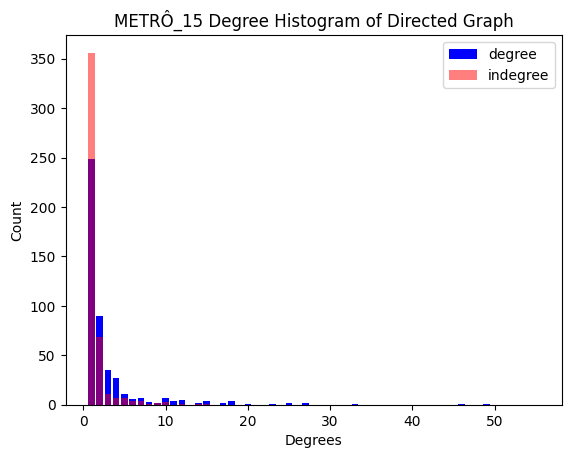

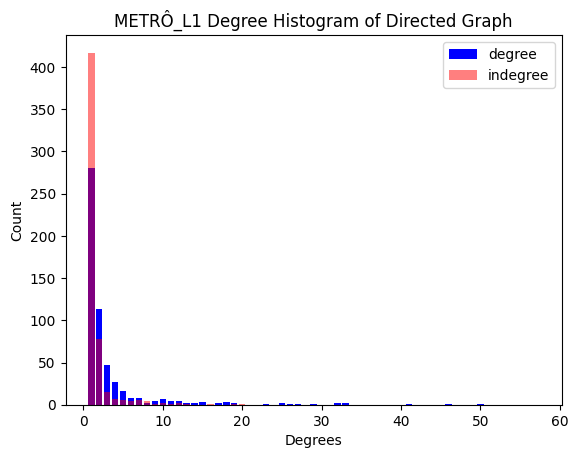

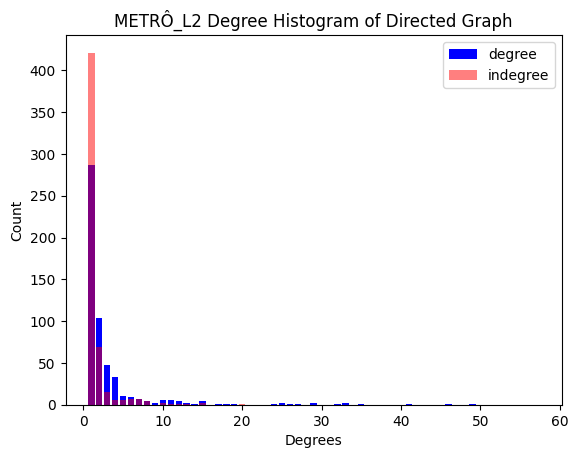

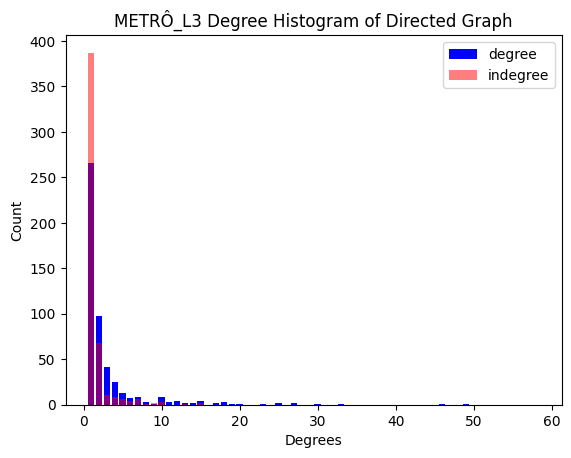

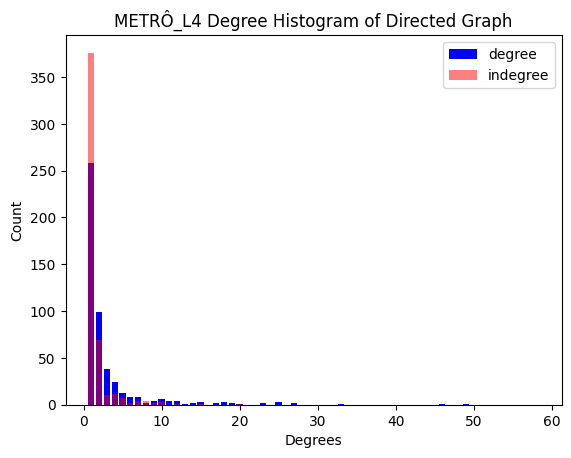

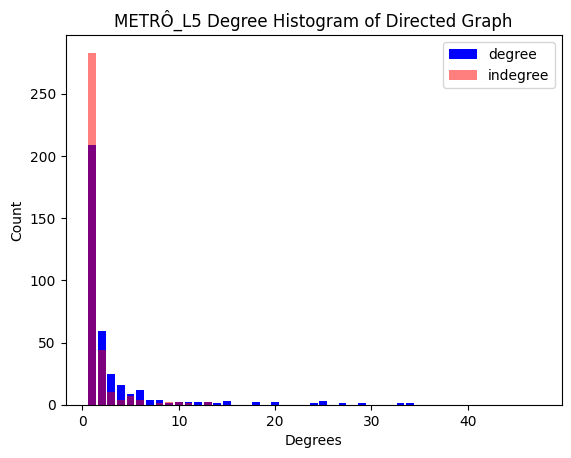

In [89]:
degree_list = list(dict(METRÔ_15.degree()).values())
in_degree_list = list(dict(METRÔ_15.in_degree()).values())
Bins = range(1, max(degree_list))
Bin2 = range(1, max(in_degree_list))
counts, k = np.histogram(degree_list, bins=Bins)
count2, kin = np.histogram(in_degree_list, bins= Bin2)
fig, ax = plt.subplots()
plt.bar(k[:-1], counts, width=0.80, color='b', label='degree')
plt.bar(kin[:-1], count2, width=0.80, color='r', label='indegree', alpha=0.5)
plt.title("METRÔ_15 Degree Histogram of Directed Graph")
plt.ylabel("Count")
plt.xlabel("Degrees")
plt.legend(loc="upper right")
print(f'METRÔ_15 average_clustering: {nx.average_clustering(METRÔ_15)}')


degree_list = list(dict(METRÔ_L1.degree()).values())
in_degree_list = list(dict(METRÔ_L1.in_degree()).values())
Bins = range(1, max(degree_list))
Bin2 = range(1, max(in_degree_list))
counts, k = np.histogram(degree_list, bins=Bins)
count2, kin = np.histogram(in_degree_list, bins= Bin2)
fig, ax = plt.subplots()
plt.bar(k[:-1], counts, width=0.80, color='b', label='degree')
plt.bar(kin[:-1], count2, width=0.80, color='r', label='indegree', alpha=0.5)
plt.title("METRÔ_L1 Degree Histogram of Directed Graph")
plt.ylabel("Count")
plt.xlabel("Degrees")
plt.legend(loc="upper right")
print(f'METRÔ_L1 average_clustering: {nx.average_clustering(METRÔ_L1)}')


degree_list = list(dict(METRÔ_L2.degree()).values())
in_degree_list = list(dict(METRÔ_L2.in_degree()).values())
Bins = range(1, max(degree_list))
Bin2 = range(1, max(in_degree_list))
counts, k = np.histogram(degree_list, bins=Bins)
count2, kin = np.histogram(in_degree_list, bins= Bin2)
fig, ax = plt.subplots()
plt.bar(k[:-1], counts, width=0.80, color='b', label='degree')
plt.bar(kin[:-1], count2, width=0.80, color='r', label='indegree', alpha=0.5)
plt.title("METRÔ_L2 Degree Histogram of Directed Graph")
plt.ylabel("Count")
plt.xlabel("Degrees")
plt.legend(loc="upper right")
print(f'METRÔ_L2 average_clustering: {nx.average_clustering(METRÔ_L2)}')


degree_list = list(dict(METRÔ_L3.degree()).values())
in_degree_list = list(dict(METRÔ_L3.in_degree()).values())
Bins = range(1, max(degree_list))
Bin2 = range(1, max(in_degree_list))
counts, k = np.histogram(degree_list, bins=Bins)
count2, kin = np.histogram(in_degree_list, bins= Bin2)
fig, ax = plt.subplots()
plt.bar(k[:-1], counts, width=0.80, color='b', label='degree')
plt.bar(kin[:-1], count2, width=0.80, color='r', label='indegree', alpha=0.5)
plt.title("METRÔ_L3 Degree Histogram of Directed Graph")
plt.ylabel("Count")
plt.xlabel("Degrees")
plt.legend(loc="upper right")
print(f'METRÔ_L3 average_clustering: {nx.average_clustering(METRÔ_L3)}')


degree_list = list(dict(METRÔ_L4.degree()).values())
in_degree_list = list(dict(METRÔ_L4.in_degree()).values())
Bins = range(1, max(degree_list))
Bin2 = range(1, max(in_degree_list))
counts, k = np.histogram(degree_list, bins=Bins)
count2, kin = np.histogram(in_degree_list, bins= Bin2)
fig, ax = plt.subplots()
plt.bar(k[:-1], counts, width=0.80, color='b', label='degree')
plt.bar(kin[:-1], count2, width=0.80, color='r', label='indegree', alpha=0.5)
plt.title("METRÔ_L4 Degree Histogram of Directed Graph")
plt.ylabel("Count")
plt.xlabel("Degrees")
plt.legend(loc="upper right")
print(f'METRÔ_L4 average_clustering: {nx.average_clustering(METRÔ_L4)}')


degree_list = list(dict(METRÔ_L5.degree()).values())
in_degree_list = list(dict(METRÔ_L5.in_degree()).values())
Bins = range(1, max(degree_list))
Bin2 = range(1, max(in_degree_list))
counts, k = np.histogram(degree_list, bins=Bins)
count2, kin = np.histogram(in_degree_list, bins= Bin2)
fig, ax = plt.subplots()
plt.bar(k[:-1], counts, width=0.80, color='b', label='degree')
plt.bar(kin[:-1], count2, width=0.80, color='r', label='indegree', alpha=0.5)
plt.title("METRÔ_L5 Degree Histogram of Directed Graph")
plt.ylabel("Count")
plt.xlabel("Degrees")
plt.legend(loc="upper right")
print(f'METRÔ_L5 average_clustering: {nx.average_clustering(METRÔ_L5)}')



<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=300ebd80-e6c5-46c8-bd7e-cc770e9fd2e6' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>